### Unconditional image generation

https://huggingface.co/docs/diffusers/en/using-diffusers/unconditional_image_generation

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 1000/1000 [00:14<00:00, 67.02it/s]


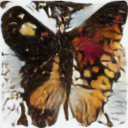

In [1]:
from diffusers import DiffusionPipeline

generator = DiffusionPipeline.from_pretrained("anton-l/ddpm-butterflies-128").to("cuda")
image = generator().images[0]
image

In [ ]:
generator(num_inference_steps=100).images[0]

### Text-to-image

https://huggingface.co/docs/diffusers/en/using-diffusers/conditional_image_generation

In [1]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 19.22it/s]


100%|██████████| 50/50 [00:01<00:00, 33.74it/s]


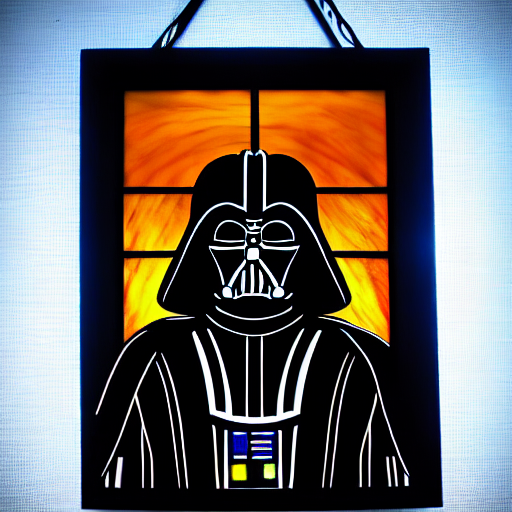

In [ ]:
image = pipeline(
    "stained glass of darth vader, backlight, centered composition, masterpiece, photorealistic, 8k"
).images[0]
image

In [3]:
from diffusers import ControlNetModel, AutoPipelineForText2Image
from diffusers.utils import load_image
import torch

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/control_v11p_sd15_openpose", torch_dtype=torch.float16, variant="fp16"
).to("cuda")
pose_image = load_image(
    "https://huggingface.co/lllyasviel/control_v11p_sd15_openpose/resolve/main/images/control.png"
)

In [6]:
controlnet

ControlNetModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (controlnet_cond_embedding): ControlNetConditioningEmbedding(
    (conv_in): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (blocks): ModuleList(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): Conv2d(32, 96, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (4): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): Conv2d(96, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (conv_out): Conv2d(256, 320, ker

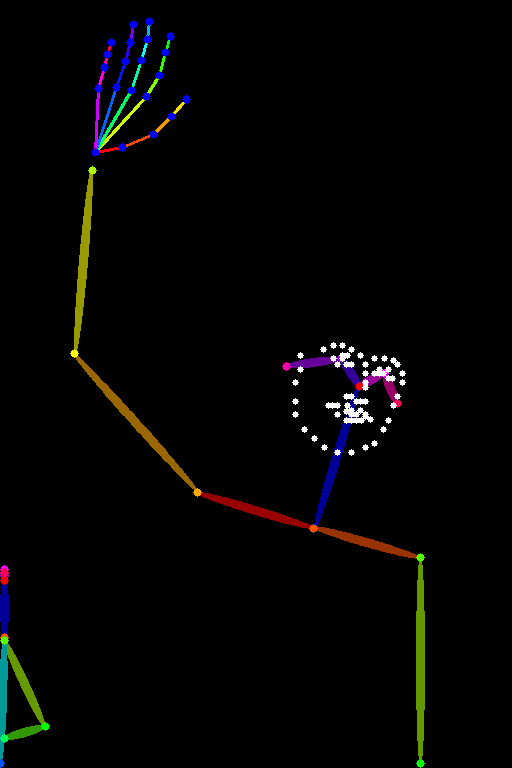

In [5]:
pose_image

100%|██████████| 50/50 [00:02<00:00, 21.12it/s]


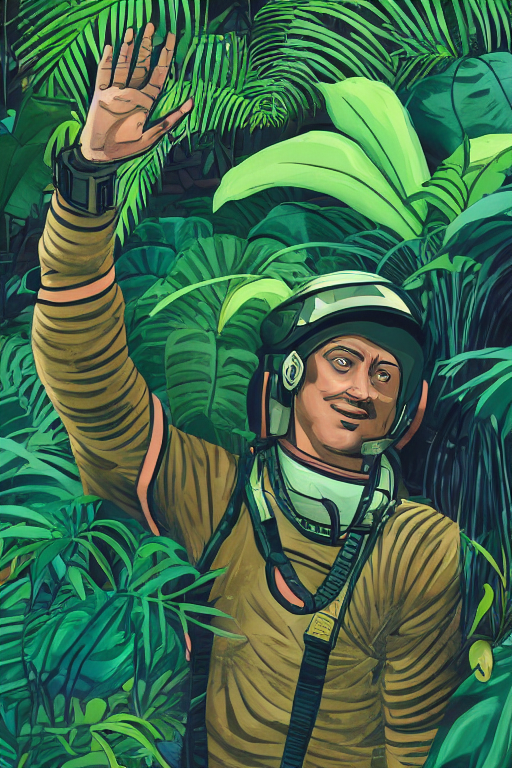

In [4]:
pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
generator = torch.Generator("cuda").manual_seed(31)
image = pipeline(
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    image=pose_image,
    generator=generator,
).images[0]
image

100%|██████████| 50/50 [00:01<00:00, 30.36it/s]


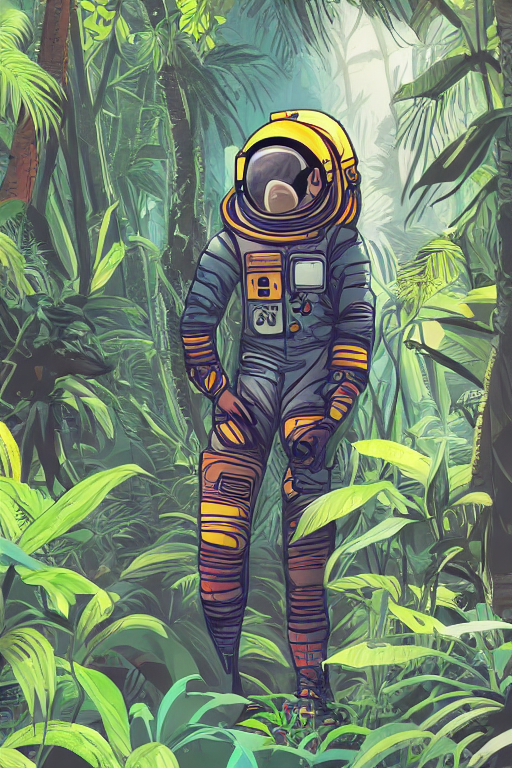

In [7]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
image = pipeline(
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    height=768,
    width=512,
).images[0]
image

100%|██████████| 50/50 [00:01<00:00, 39.46it/s]


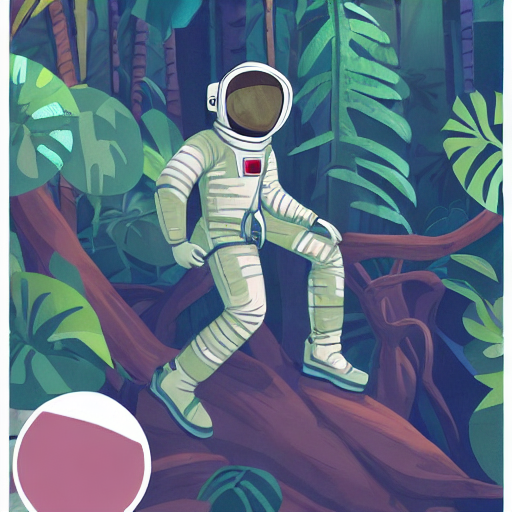

In [9]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")
image = pipeline(
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    guidance_scale=7.5,
).images[0]
image

100%|██████████| 50/50 [00:01<00:00, 39.87it/s]


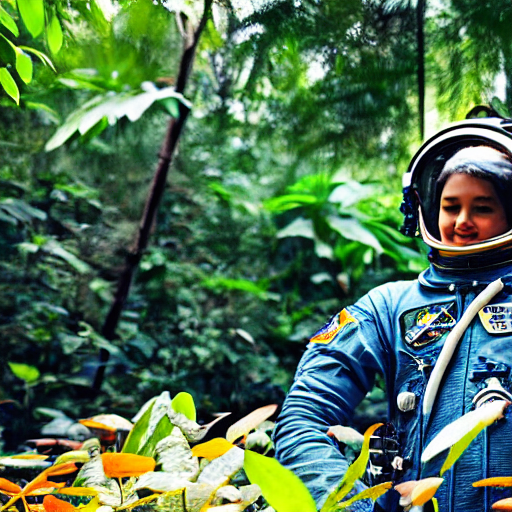

In [10]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")
image = pipeline(
    prompt="Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    negative_prompt="ugly, deformed, disfigured, poor details, bad anatomy",
).images[0]
image

100%|██████████| 50/50 [00:01<00:00, 39.31it/s]


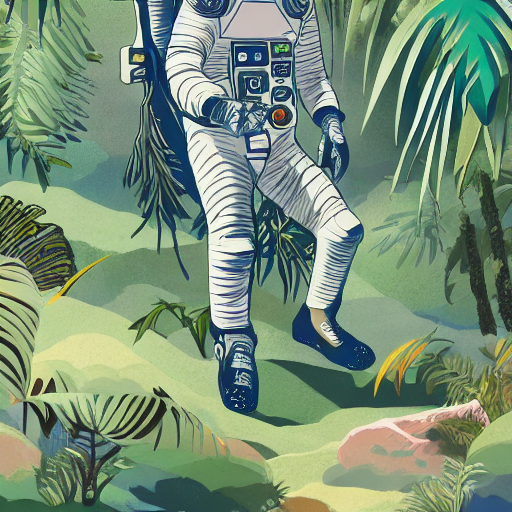

In [11]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")
generator = torch.Generator(device="cuda").manual_seed(30)
image = pipeline(
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    generator=generator,
).images[0]
image

### Image-to-image

https://huggingface.co/docs/diffusers/en/using-diffusers/img2img

In [1]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder",
    torch_dtype=torch.float16,
    use_safetensors=True,
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
)

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  4.91it/s]


100%|██████████| 25/25 [00:00<00:00, 34.11it/s]
/home/user-name-goes-here/.local/lib/python3.11/site-packages/diffusers/pipelines/kandinsky2_2/pipeline_kandinsky2_2_img2img.py:284: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider use `callback_on_step_end`
  deprecate(
100%|██████████| 30/30 [00:01<00:00, 19.78it/s]


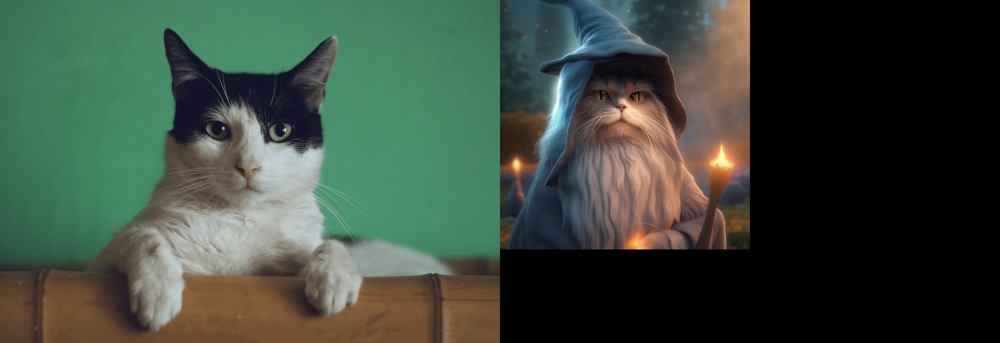

In [2]:
prompt = "cat wizard, gandalf, lord of the rings, detailed, fantasy, cute, adorable, Pixar, Disney, 8k"
image = pipeline(prompt, image=init_image).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

100%|██████████| 40/40 [00:02<00:00, 19.18it/s]


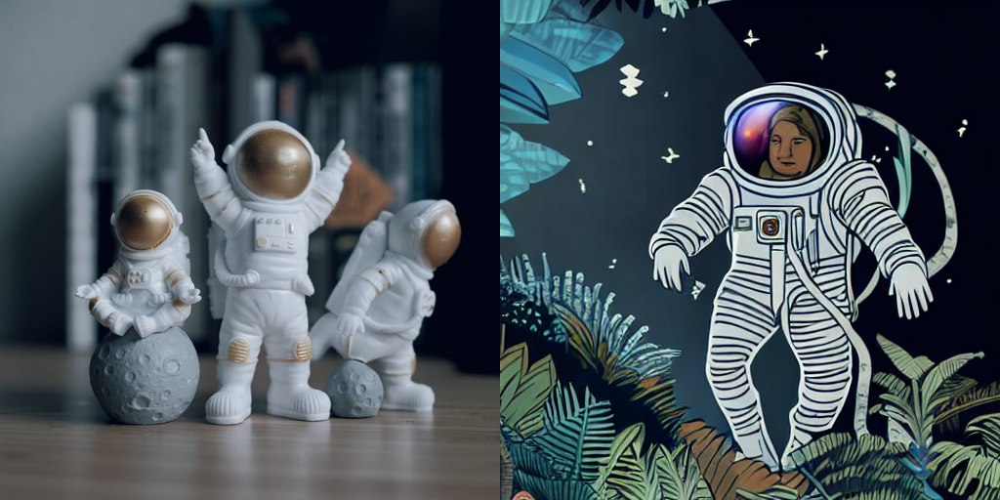

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
init_image = load_image(url)

prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, strength=0.8).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [4]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
init_image = load_image(url)

prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

# pass prompt and image to pipeline
image = pipeline(prompt, image=init_image, output_type="latent").images[0]

100%|██████████| 40/40 [00:02<00:00, 19.53it/s]


In [5]:
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "ogkalu/Comic-Diffusion", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# need to include the token "charliebo artstyle" in the prompt to use this checkpoint
image = pipeline(
    "Astronaut in a jungle, charliebo artstyle", image=image, output_type="latent"
).images[0]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--ogkalu--Comic-Diffusion/snapshots/ff684f581ab24e094e2055d9422e9ee076d139a8/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--ogkalu--Comic-Diffusion/snapshots/ff684f581ab24e094e2055d9422e9ee076d139a8/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  86%|████████▌ | 6/7 [00:00<00:00,  6.34it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--ogkalu--Comic-Diffusion/snapshots/ff684f581ab24e094e2055d9422e9ee076d139a8/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--ogkalu--Comic-Diffusion/snapshots/ff684f581ab24e094e2055d9422e9ee0

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--kohbanye--pixel-art-style/snapshots/6231a110c002a2dbcb845fcc0b69f075aa2cd381/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--kohbanye--pixel-art-style/snapshots/6231a110c002a2dbcb845fcc0b69f075aa2cd381/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  50%|█████     | 3/6 [00:00<00:00, 26.03it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--kohbanye--pixel-art-style/snapshots/6231a110c002a2dbcb845fcc0b69f075aa2cd381/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--kohbanye--pixel-art-style/snapshots/6231a110c002a2dbcb845fcc

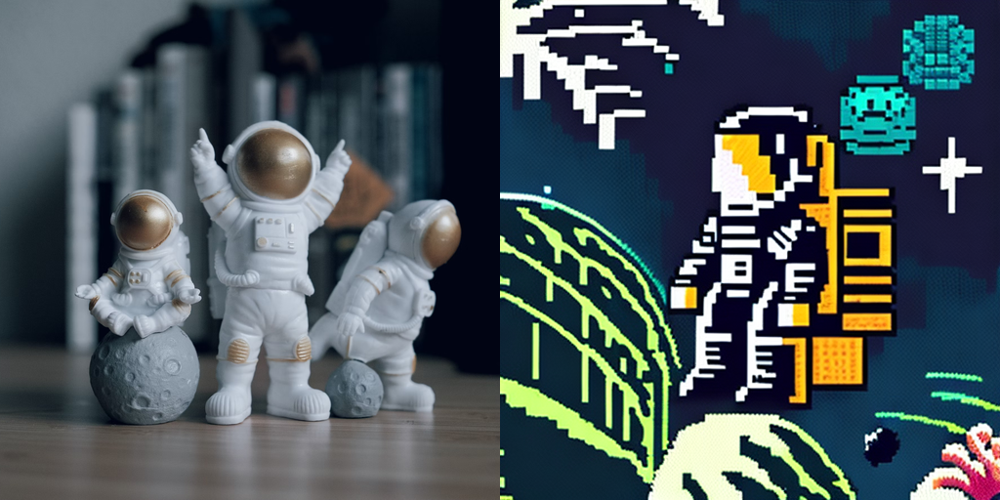

In [6]:
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "kohbanye/pixel-art-style", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# need to include the token "pixelartstyle" in the prompt to use this checkpoint
image = pipeline("Astronaut in a jungle, pixelartstyle", image=image).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [7]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import make_image_grid, load_image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# prepare image
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
init_image = load_image(url)

prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

# pass prompt and image to pipeline
image_1 = pipeline(prompt, image=init_image, output_type="latent").images[0]

100%|██████████| 40/40 [00:02<00:00, 19.83it/s]


In [8]:
from diffusers import StableDiffusionLatentUpscalePipeline

upscaler = StableDiffusionLatentUpscalePipeline.from_pretrained(
    "stabilityai/sd-x2-latent-upscaler", torch_dtype=torch.float16, use_safetensors=True
)
upscaler.enable_model_cpu_offload()
upscaler.enable_xformers_memory_efficient_attention()

image_2 = upscaler(prompt, image=image_1).images[0]

100%|██████████| 75/75 [00:04<00:00, 17.43it/s]


In [9]:
from diffusers import StableDiffusionUpscalePipeline

super_res = StableDiffusionUpscalePipeline.from_pretrained(
    "stabilityai/stable-diffusion-x4-upscaler",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
super_res.enable_model_cpu_offload()
super_res.enable_xformers_memory_efficient_attention()

image_3 = super_res(prompt, image=image_2).images[0]
make_image_grid([init_image, image_3.resize((512, 512))], rows=1, cols=2)

100%|██████████| 75/75 [02:49<00:00,  2.26s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 8.00 GiB. GPU 0 has a total capacity of 23.55 GiB of which 5.36 GiB is free. Including non-PyTorch memory, this process has 0 bytes memory in use. Of the allocated memory 16.86 GiB is allocated by PyTorch, and 845.23 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

### Inpainting

https://huggingface.co/docs/diffusers/en/using-diffusers/inpaint

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  8.30it/s]


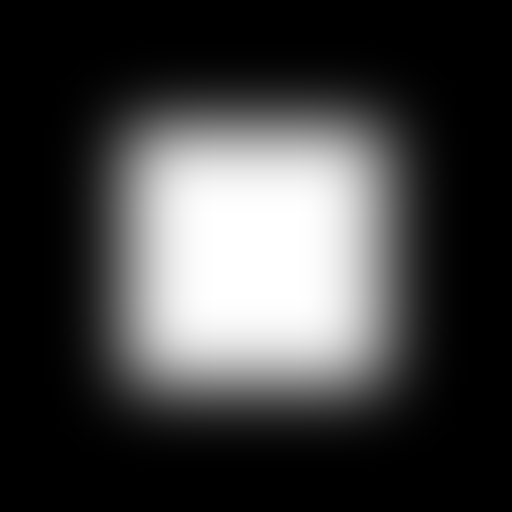

In [1]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
from PIL import Image

pipeline = AutoPipelineForInpainting.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")

mask = load_image(
    "https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore_mask.png"
)
blurred_mask = pipeline.mask_processor.blur(mask, blur_factor=33)
blurred_mask

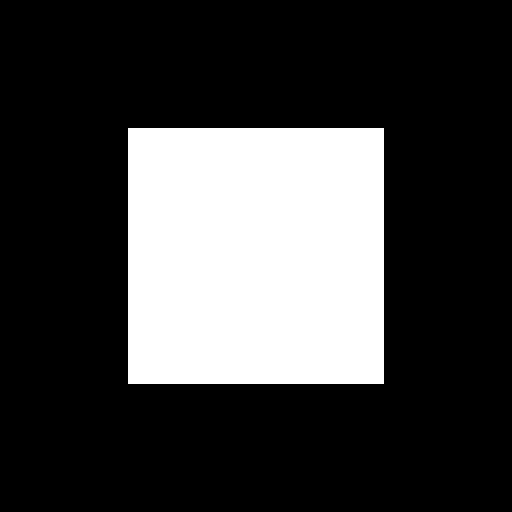

In [3]:
mask

100%|██████████| 50/50 [00:02<00:00, 19.41it/s]


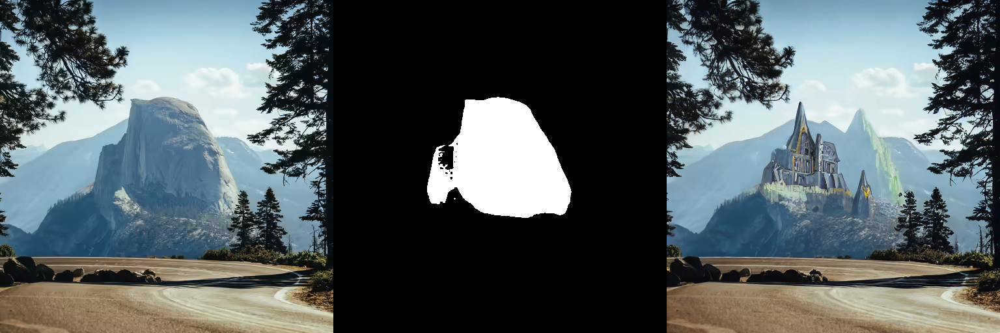

In [2]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png"
)
mask_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png"
)

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(
    prompt=prompt, image=init_image, mask_image=mask_image, generator=generator
).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

100%|██████████| 50/50 [00:01<00:00, 38.30it/s]


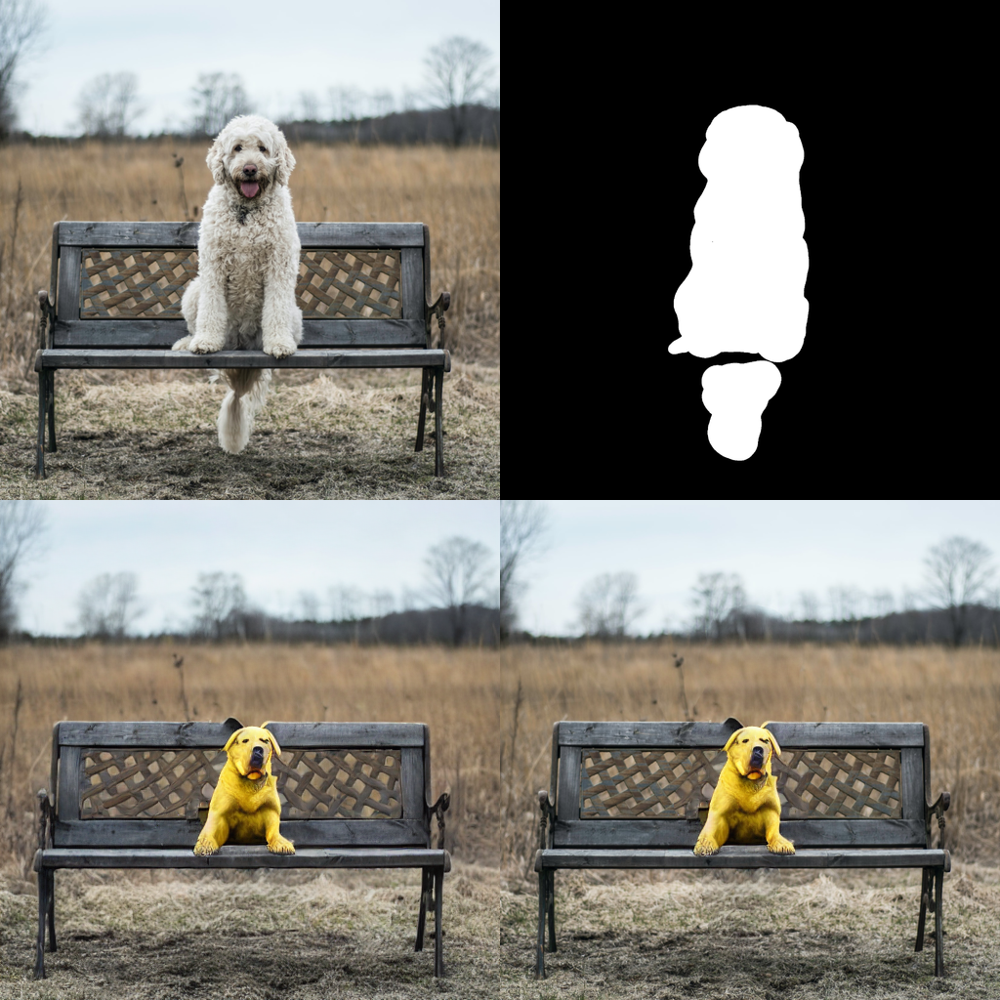

In [ ]:
import PIL
import numpy as np
import torch

from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

device = "cuda"
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    variant="fp16",
    torch_dtype=torch.float16,
)
pipeline = pipeline.to(device)

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).resize((512, 512))
mask_image = load_image(mask_url).resize((512, 512))

prompt = "Face of a yellow dog, high resolution, sitting on a park bench"
repainted_image = pipeline(
    prompt=prompt, image=init_image, mask_image=mask_image
).images[0]
# repainted_image.save("repainted_image.png")

unmasked_unchanged_image = pipeline.image_processor.apply_overlay(
    mask_image, init_image, repainted_image
)
# unmasked_unchanged_image.save("force_unmasked_unchanged.png")
make_image_grid(
    [init_image, mask_image, repainted_image, unmasked_unchanged_image], rows=2, cols=2
)

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 30/30 [00:01<00:00, 16.69it/s]


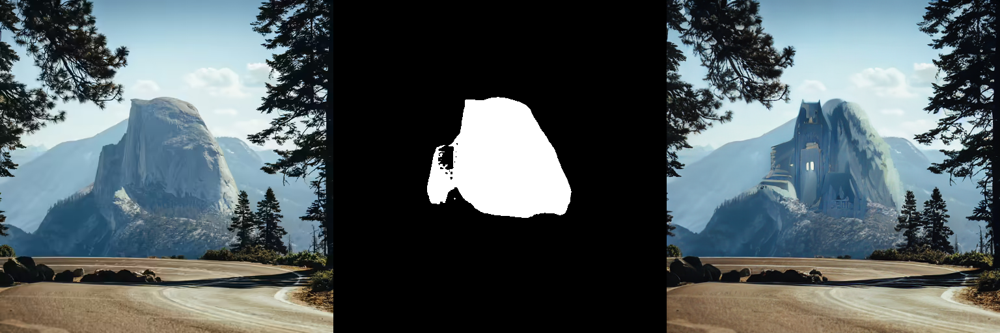

In [1]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png"
)
mask_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png"
)

prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(
    prompt=prompt, image=init_image, mask_image=mask_image, strength=0.6
).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

In [1]:
import torch
import numpy as np
from diffusers import ControlNetModel, StableDiffusionControlNetInpaintPipeline
from diffusers.utils import load_image, make_image_grid
import PIL


# load ControlNet
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/control_v11p_sd15_inpaint", torch_dtype=torch.float16, variant="fp16"
)

# pass ControlNet to the pipeline
pipeline = StableDiffusionControlNetInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    controlnet=controlnet,
    torch_dtype=torch.float16,
    variant="fp16",
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png"
)
mask_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png"
)


# prepare control image
def make_inpaint_condition(init_image, mask_image):
    init_image = np.array(init_image.convert("RGB")).astype(np.float32) / 255.0
    mask_image = np.array(mask_image.convert("L")).astype(np.float32) / 255.0

    assert (
        init_image.shape[0:1] == mask_image.shape[0:1]
    ), "image and image_mask must have the same image size"
    init_image[mask_image > 0.5] = -1.0  # set as masked pixel
    init_image = np.expand_dims(init_image, 0).transpose(0, 3, 1, 2)
    init_image = torch.from_numpy(init_image)
    return init_image


control_image = make_inpaint_condition(init_image, mask_image)

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 15.48it/s]


100%|██████████| 50/50 [00:03<00:00, 14.07it/s]


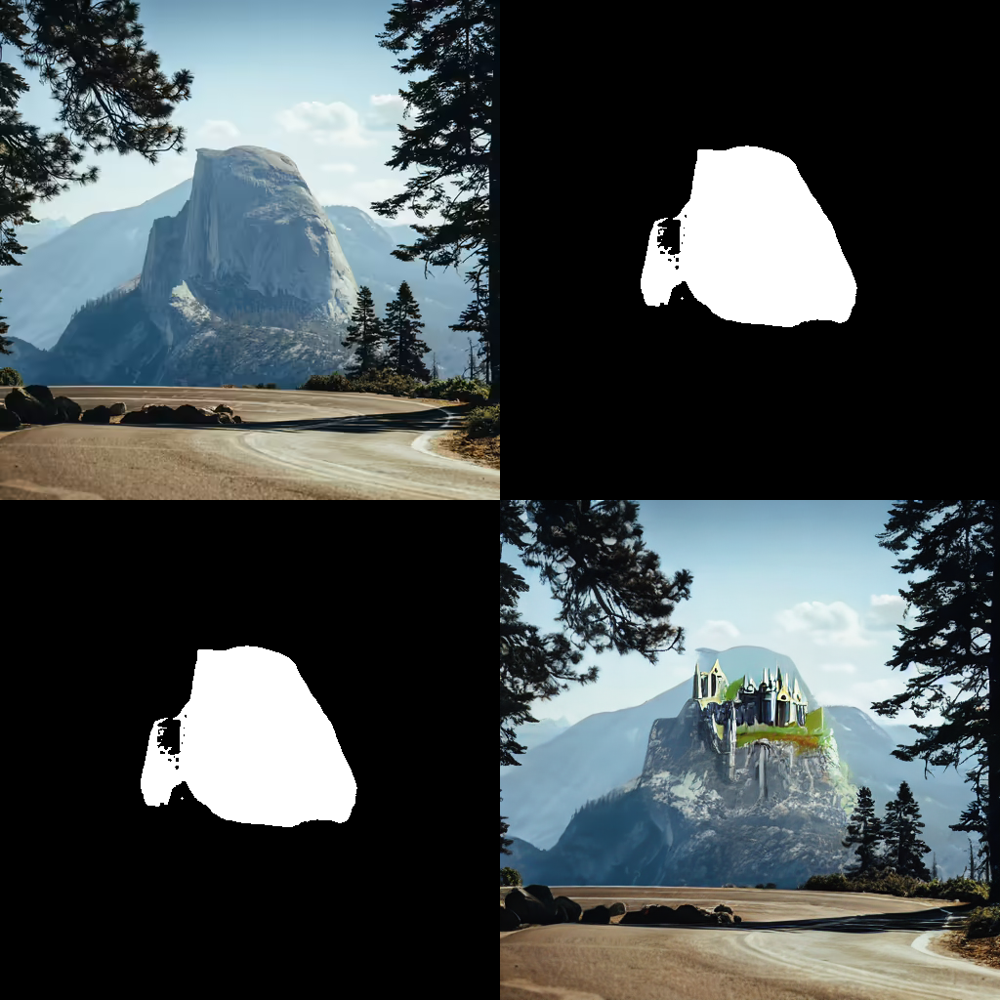

In [2]:
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(
    prompt=prompt, image=init_image, mask_image=mask_image, control_image=control_image
).images[0]

make_image_grid(
    [
        init_image,
        mask_image,
        PIL.Image.fromarray(np.uint8(control_image[0][0])).convert("RGB"),
        image,
    ],
    rows=2,
    cols=2,
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--nitrosocke--elden-ring-diffusion/snapshots/9a62d6f236829197d4aa9f314c7e488cbe3531d1/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--nitrosocke--elden-ring-diffusion/snapshots/9a62d6f236829197d4aa9f314c7e488cbe3531d1/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  86%|████████▌ | 6/7 [00:00<00:00,  7.18it/s]An error occurred while trying to fetch /home/user-name-goes-here/.cache/huggingface/hub/models--nitrosocke--elden-ring-diffusion/snapshots/9a62d6f236829197d4aa9f314c7e488cbe3531d1/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/user-name-goes-here/.cache/huggingface/hub/models--nitrosocke--elden-ring-diffusion/snapsh

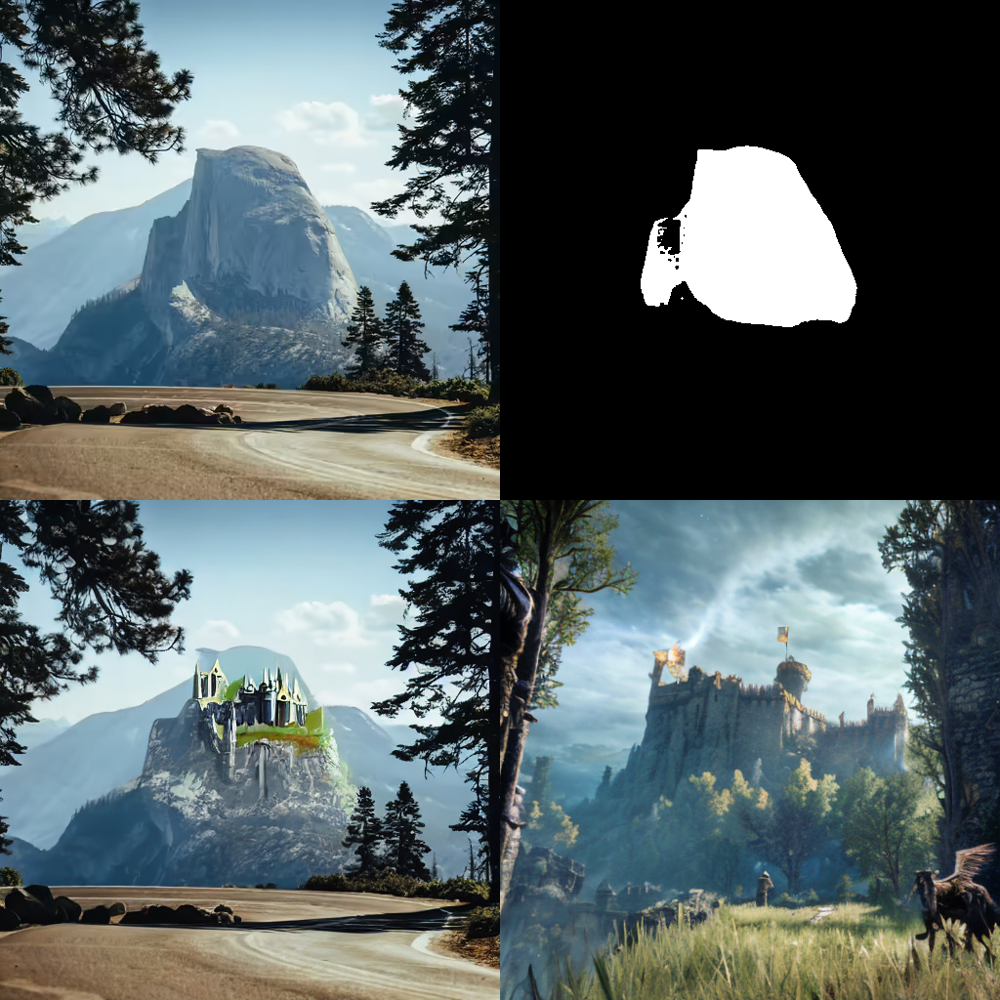

In [3]:
from diffusers import AutoPipelineForImage2Image

pipeline = AutoPipelineForImage2Image.from_pretrained(
    "nitrosocke/elden-ring-diffusion",
    torch_dtype=torch.float16,
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

prompt = "elden ring style castle"  # include the token "elden ring style" in the prompt
negative_prompt = "bad architecture, deformed, disfigured, poor details"

image_elden_ring = pipeline(
    prompt, negative_prompt=negative_prompt, image=image
).images[0]
make_image_grid([init_image, mask_image, image, image_elden_ring], rows=2, cols=2)